# Tests on BCE simulations

Molecular recognition processes can be explained under different paradigms. Lock and key mechanism, induced fit or conformational selection. In the conformational selection model, the ligand is able to adopt the bioactive conformation in solution and the receptor selects it. The more stable is this bioactive conformation in solution, the smaller the entropic penalty due to binding and thus, the higher the affinity. Some cases that might scape this model are molecular recognition processes involving many strong interactions. As the entropy loss due to binding might be compensated by the enthalpy gain due to favorable interactions. 

The bioactive conformational ensemble modelling approach aims at estimating the dynamical landscape of the ligand in solution. This is done by performing enhanced molecular dynamics (replica exchange with solute tempering REST2) to sample the conformational space of the ligand. Then the ensemble of conformations is clustered and geometry of the centroid from each cluster is optimized with self-consistent reaction field quantum mechanics (SCRF-QM) calculations. Thus one obtains sampling of different conformations and two estimates of free energy differences. One coming from a classical force field and another from the SCRF-QM calculations. Both in good agreement for the dataset of the original paper, see the full description of the method in [Orozco et al.](https://pubs.acs.org/doi/10.1021/acs.jctc.0c00304).

Here we will consider 3 different peptides with known affinities and active conformations. The peptides are peptide 1, peptide 2 and peptide 7 from [Yu et al. publication](https://pubs.acs.org/doi/abs/10.1021/acs.jcim.3c01359). The binding affinities are shown in the table below.

| Peptide | Affinity (nM) |
|---------|---------------|
| 1       | 1.5           |
| 2       | 285           |
| 7       | 0.00826       |

If the conformational selection mechanism describes well the binding process for these peptides, we should expect a correlation between the affinity and the stability of the bioactive conformation in solution. Here, we will project both BCE sampling (classical MD + replica exchange) together with the bioactive conformation onto different collective variables for each peptide. And we will check if the affinity correlates with the stability of the bioactive conformation.


In [6]:
from deep_cartograph.run import deep_cartograph
from IPython.display import Image, display
from typing import Literal
import logging
import shutil
import yaml
import os

# Set logging level
logging.basicConfig(level=logging.INFO)

def run_deep_cartograph(system_name: str, features: Literal['torsions', 'distances']):

    # Input configuration
    config_path = f"../../data/peptide_ensemble/input/{features}_config.yml"

    with open(config_path) as config_file:
        configuration = yaml.load(config_file, Loader = yaml.FullLoader)

    # Input trajectory and topology
    input_path = f"../../data/peptide_ensemble/input/{system_name}"
    traj_path = os.path.join(input_path, f'{system_name}.xtc')
    top_path = os.path.join(input_path, f'{system_name}.pdb')

    # Input reference structure
    reference_folder = f"../../data/peptide_ensemble/input/{system_name}/active_conformation"
        
    # Output folder
    output_folder = f"../../data/peptide_ensemble/output/{system_name}/{features}"

    # Clean output folder
    if os.path.exists(output_folder):
        shutil.rmtree(output_folder)

    # Run workflow 
    deep_cartograph(
        configuration = configuration,
        trajectory = traj_path,
        topology = top_path,
        reference_folder = reference_folder,
        use_reference_labels = True,
        output_folder = output_folder)

def show_results(system_name: str, features: Literal['torsions', 'distances'], model_name: str):

    # Output folder
    output_folder = f"../../data/peptide_ensemble/output/{system_name}/{features}"
    
    # Training folder
    training_folder = os.path.join(output_folder, 'train_colvars')

    # Model folder
    model_folder = os.path.join(training_folder, model_name)

    # Paths to images
    loss = os.path.join(model_folder, 'loss.png')
    trajectory_clustered = os.path.join(model_folder, 'trajectory_clustered.png')
    fes = os.path.join(model_folder, 'fes/fes.png')
    paths = [loss, trajectory_clustered, fes]

    # Instantiate Image objects
    images = [Image(filename=path, width=500) for path in paths if os.path.exists(path)]

    # Display images
    display(*images)

## Peptide 1

In [2]:
system_name = 'peptide1'
run_deep_cartograph(system_name, 'torsions')

INFO:deep_cartograph:================
INFO:deep_cartograph:Compute features
INFO:deep_cartograph:================
INFO:deep_cartograph:Trajectory file: ../../data/peptide_ensemble/input/peptide1/peptide1.xtc
/shared/work/pnavarro/envs/deep_cartograph/lib/python3.10/site-packages/MDAnalysis/coordinates/PDB.py:429: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn("1 A^3 CRYST1 record,"
/shared/work/pnavarro/envs/deep_cartograph/lib/python3.10/site-packages/MDAnalysis/coordinates/PDB.py:747: UserWarning: Unit cell dimensions not found. CRYST1 record set to unitary values.
  warnings.warn("Unit cell dimensions not found. "
INFO:deep_cartograph.modules.md.md:Topology contains bonds. Using bonds to find dihedrals.
INFO:deep_cartograph.modules.plumed.input_file.input_file:Found 348 features for tor
INFO:deep_cartograph.modules.plumed.utils:Executing PLUMED driver command: ml PLUMED/2.9.0-intel-2021b && unset I_MPI_PMI_L

<Figure size 640x480 with 0 Axes>

<Figure size 500x400 with 0 Axes>

<Figure size 640x480 with 0 Axes>

### PCA

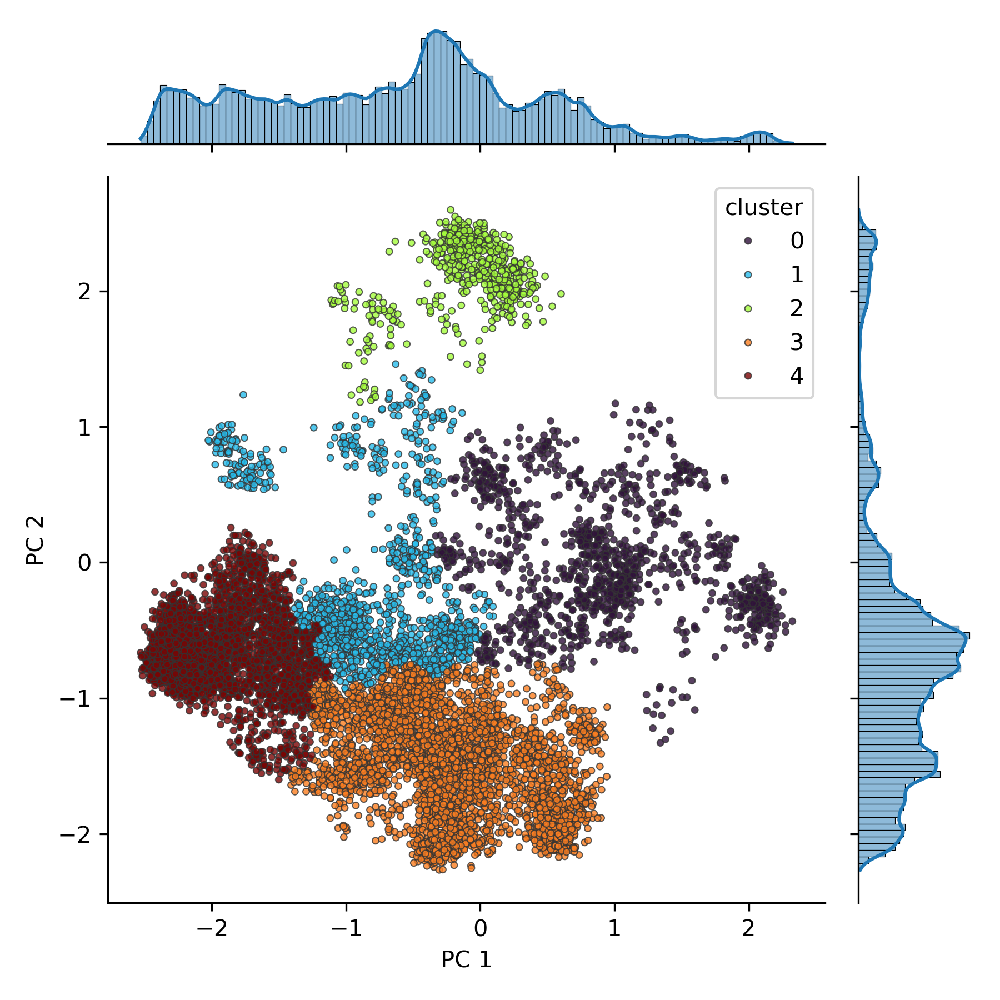

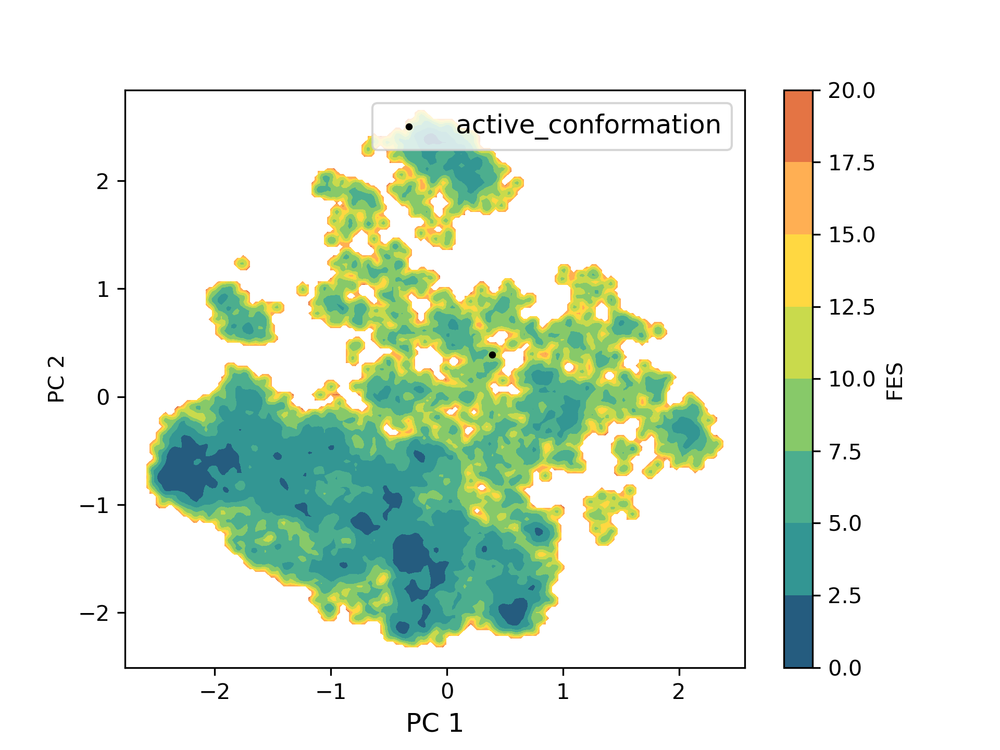

In [7]:
show_results(system_name, 'torsions', 'pca')

### AE

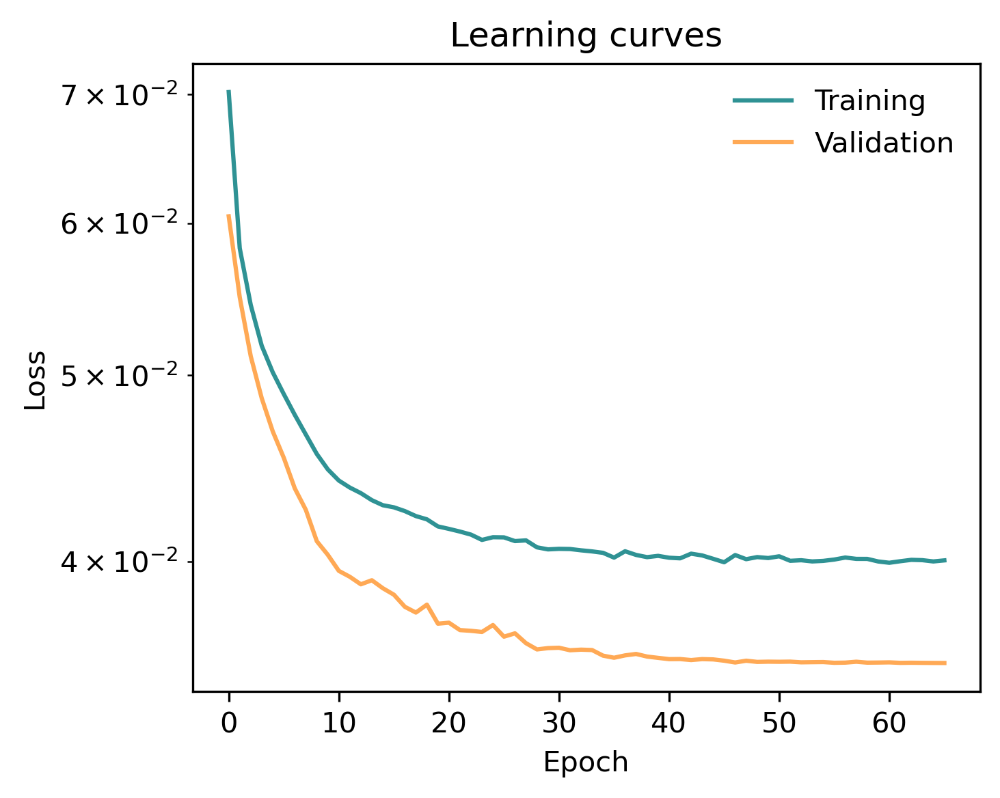

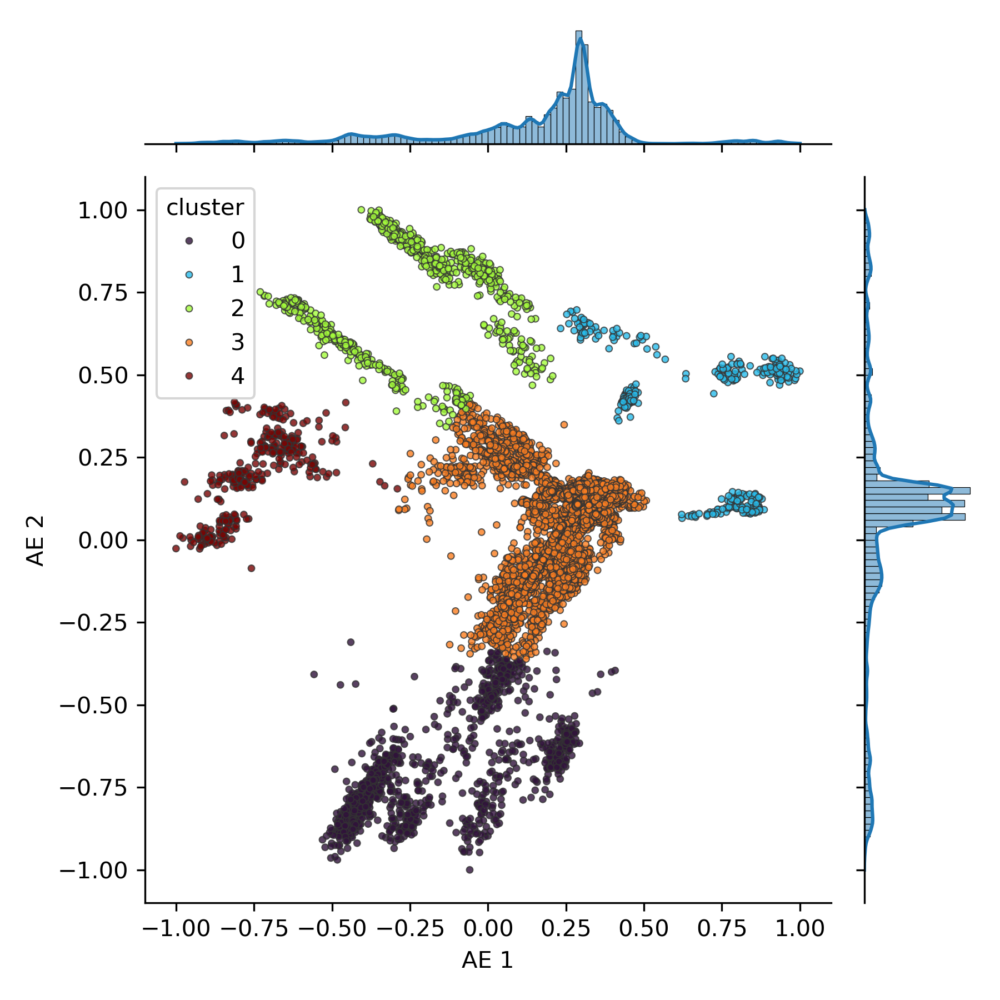

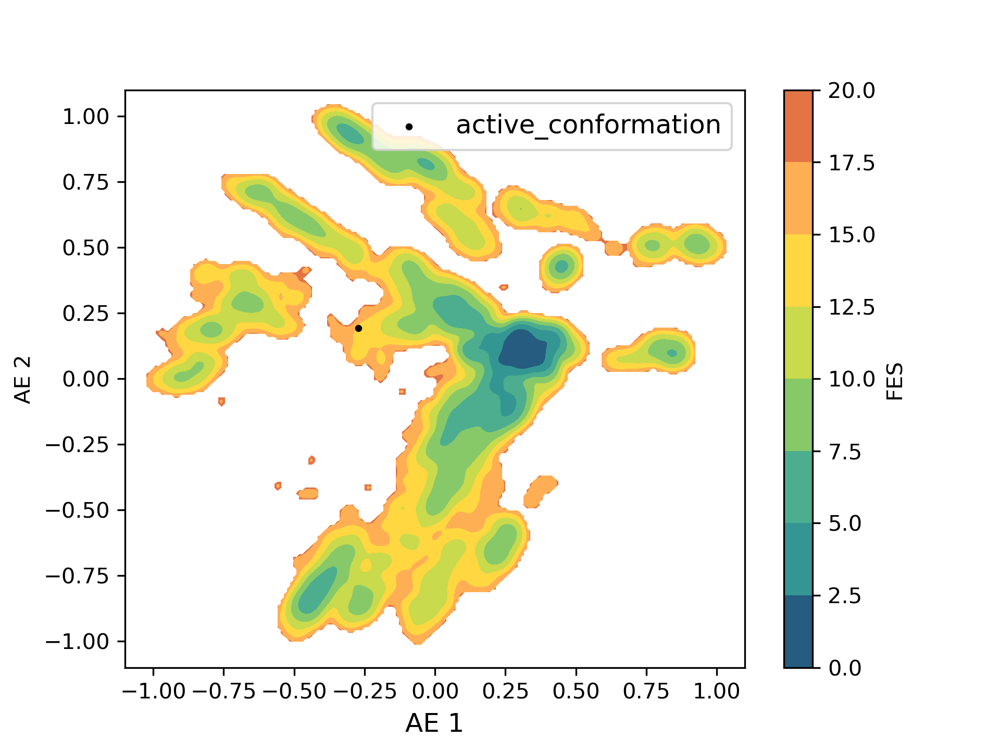

In [8]:
show_results(system_name, 'torsions', 'ae')

## Peptide 2

In [10]:
system_name = 'peptide2'
run_deep_cartograph(system_name, 'torsions')

INFO:deep_cartograph:================
INFO:deep_cartograph:Compute features
INFO:deep_cartograph:================
INFO:deep_cartograph:Trajectory file: ../../data/peptide_ensemble/input/peptide2/peptide2.xtc
/shared/work/pnavarro/envs/deep_cartograph/lib/python3.10/site-packages/MDAnalysis/coordinates/PDB.py:429: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn("1 A^3 CRYST1 record,"
/shared/work/pnavarro/envs/deep_cartograph/lib/python3.10/site-packages/MDAnalysis/coordinates/PDB.py:747: UserWarning: Unit cell dimensions not found. CRYST1 record set to unitary values.
  warnings.warn("Unit cell dimensions not found. "
INFO:deep_cartograph.modules.md.md:Topology contains bonds. Using bonds to find dihedrals.
INFO:deep_cartograph.modules.plumed.input_file.input_file:Found 346 features for tor
INFO:deep_cartograph.modules.plumed.utils:Executing PLUMED driver command: ml PLUMED/2.9.0-intel-2021b && unset I_MPI_PMI_L

INFO:deep_cartograph:Elapsed time (Compute features): 00 h 00 min 18 s
INFO:deep_cartograph:================
INFO:deep_cartograph:Compute features
INFO:deep_cartograph:================
INFO:deep_cartograph:Trajectory file: ../../data/peptide_ensemble/input/peptide2/active_conformation/active_conformation.pdb
INFO:deep_cartograph.modules.md.md:Topology contains bonds. Using bonds to find dihedrals.
INFO:deep_cartograph.modules.plumed.input_file.input_file:Found 346 features for tor
INFO:deep_cartograph.modules.plumed.utils:Executing PLUMED driver command: ml PLUMED/2.9.0-intel-2021b && unset I_MPI_PMI_LIBRARY && /eb/x86_64/software/PLUMED/2.9.0-intel-2021b/bin/plumed driver --plumed /home/pnavarro/repos/NBDsoftware/CV_learning/deep_cartograph/data/peptide_ensemble/output/peptide2/torsions/compute_features_active_conformation/torsions.dat --mf_pdb /home/pnavarro/repos/NBDsoftware/CV_learning/deep_cartograph/data/peptide_ensemble/input/peptide2/active_conformation/active_conformation.pdb 

<Figure size 640x480 with 0 Axes>

<Figure size 500x400 with 0 Axes>

<Figure size 640x480 with 0 Axes>

### PCA

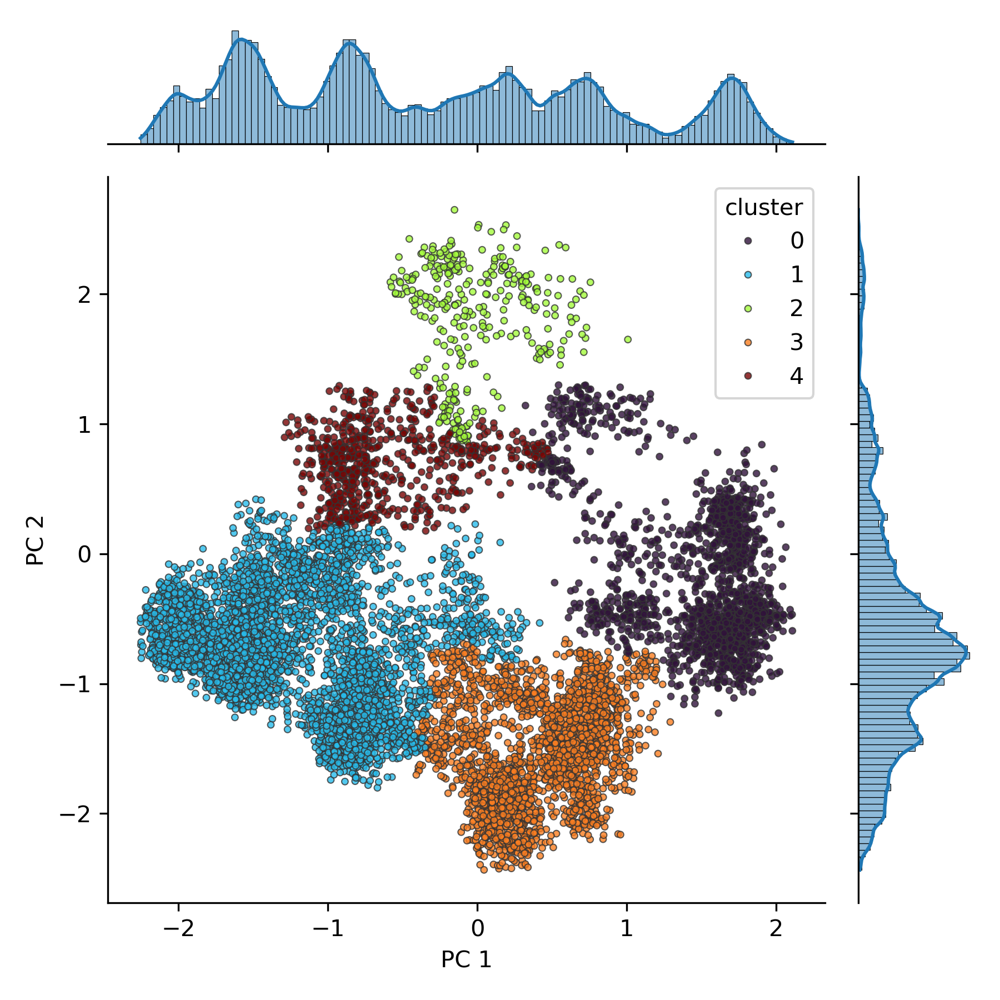

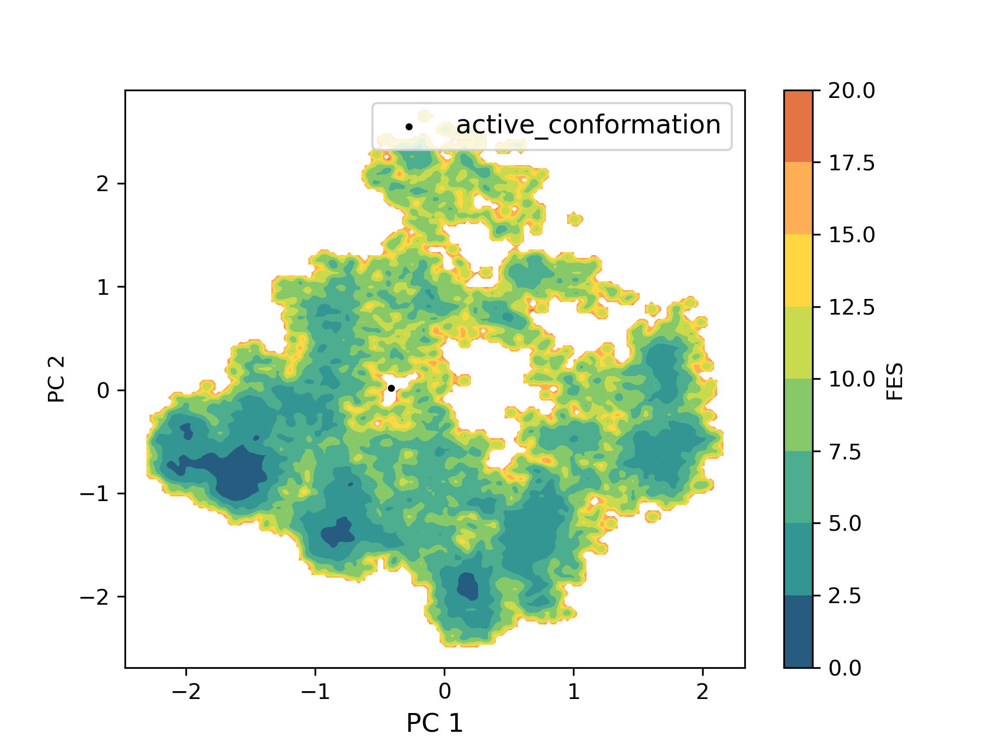

In [11]:
show_results(system_name, 'torsions', 'pca')

### AE

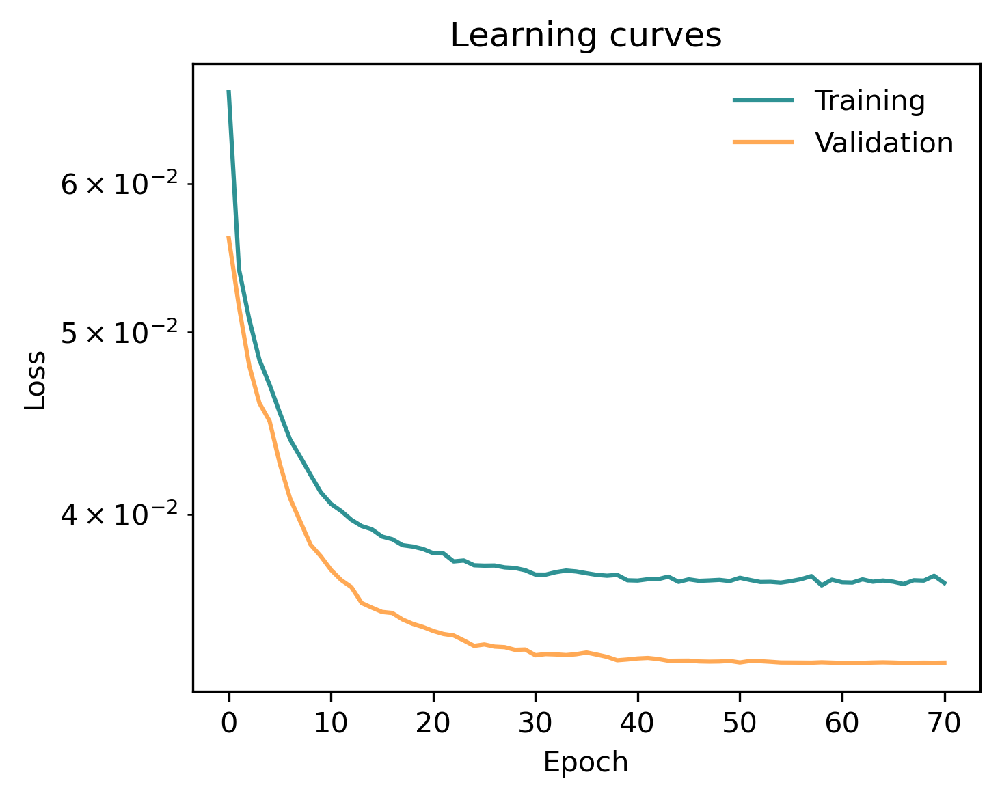

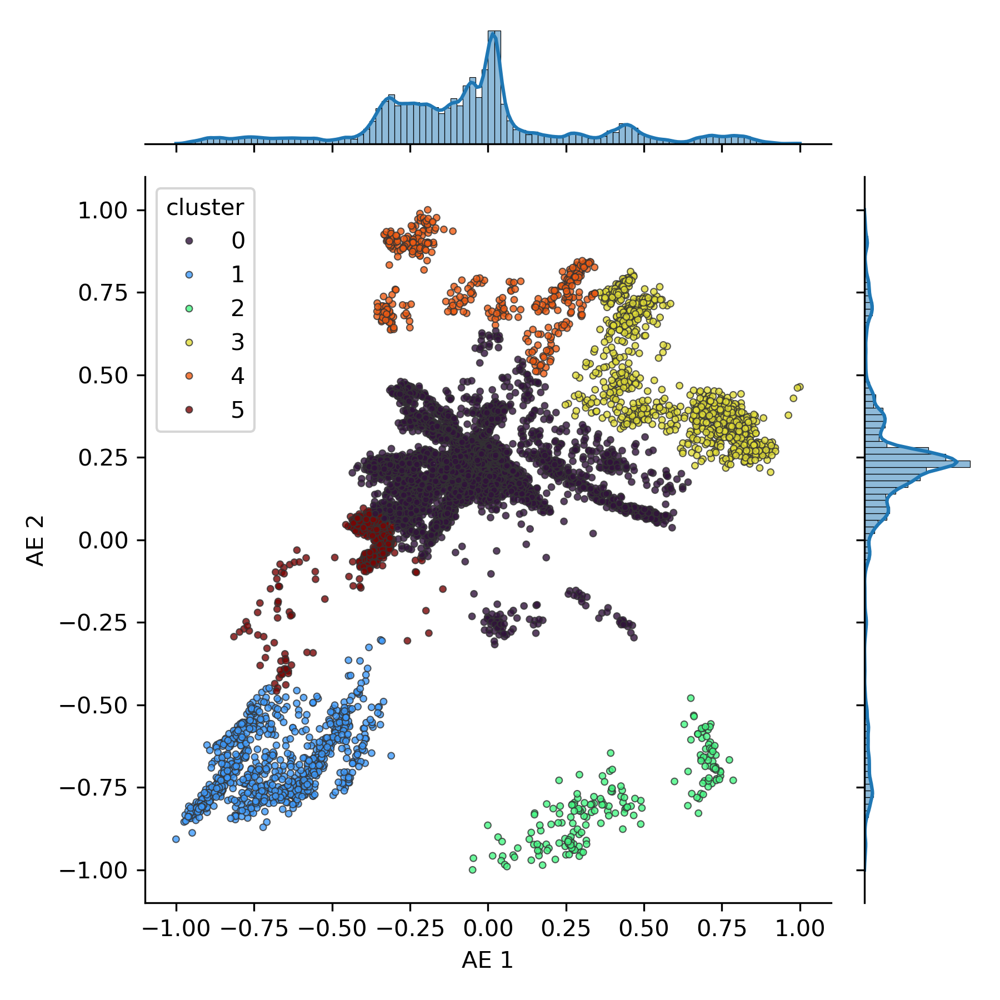

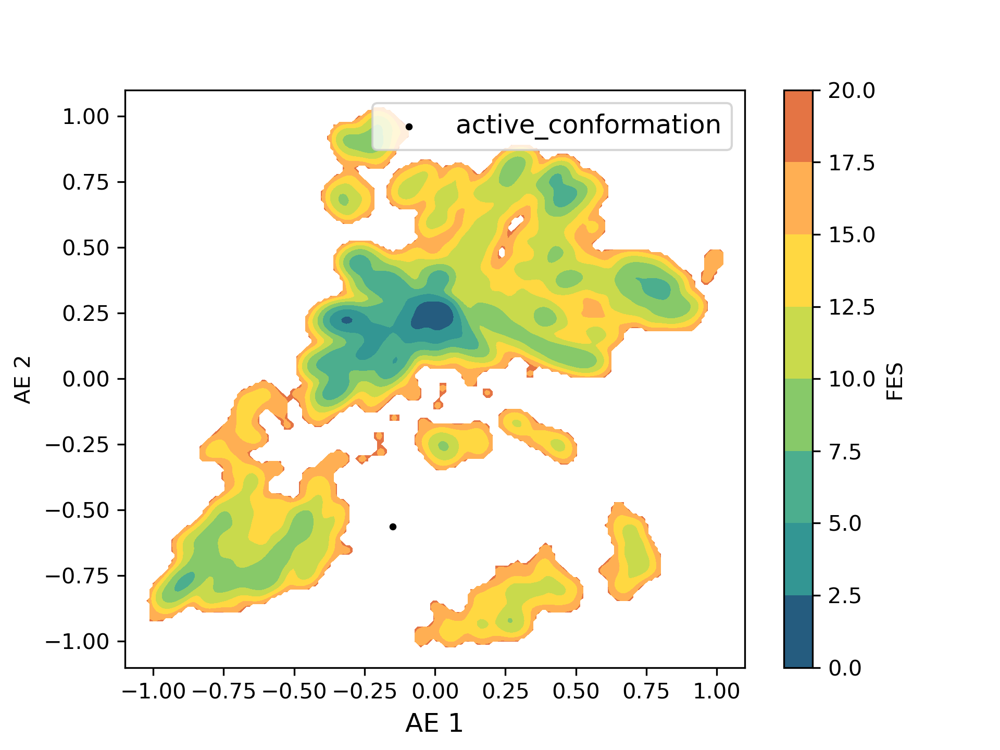

In [12]:
show_results(system_name, 'torsions', 'ae')

## Peptide 7

In [13]:
system_name = 'peptide7'
run_deep_cartograph(system_name, 'torsions')

INFO:deep_cartograph:================
INFO:deep_cartograph:Compute features
INFO:deep_cartograph:================
INFO:deep_cartograph:Trajectory file: ../../data/peptide_ensemble/input/peptide7/peptide7.xtc
/shared/work/pnavarro/envs/deep_cartograph/lib/python3.10/site-packages/MDAnalysis/coordinates/PDB.py:429: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn("1 A^3 CRYST1 record,"
/shared/work/pnavarro/envs/deep_cartograph/lib/python3.10/site-packages/MDAnalysis/coordinates/PDB.py:747: UserWarning: Unit cell dimensions not found. CRYST1 record set to unitary values.
  warnings.warn("Unit cell dimensions not found. "
INFO:deep_cartograph.modules.md.md:Topology contains bonds. Using bonds to find dihedrals.
INFO:deep_cartograph.modules.plumed.input_file.input_file:Found 418 features for tor
INFO:deep_cartograph.modules.plumed.utils:Executing PLUMED driver command: ml PLUMED/2.9.0-intel-2021b && unset I_MPI_PMI_L

<Figure size 640x480 with 0 Axes>

<Figure size 500x400 with 0 Axes>

<Figure size 640x480 with 0 Axes>

### PCA

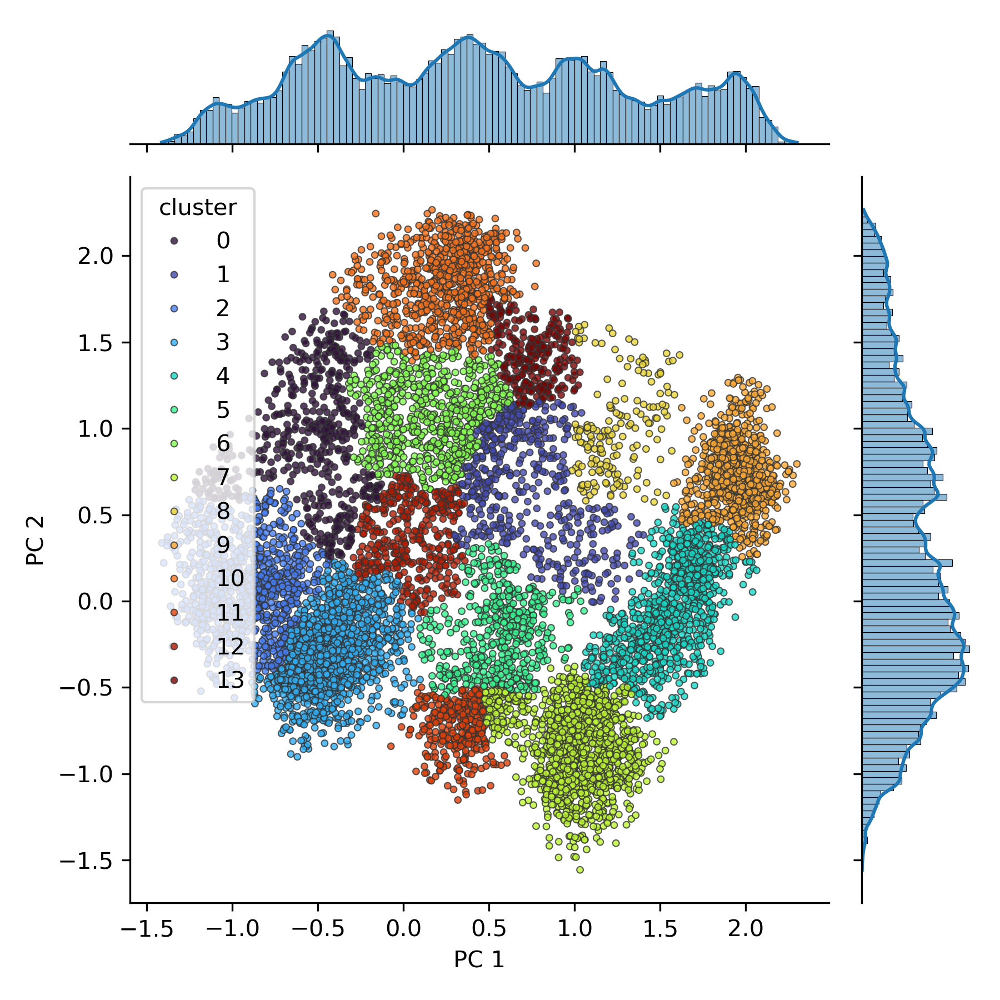

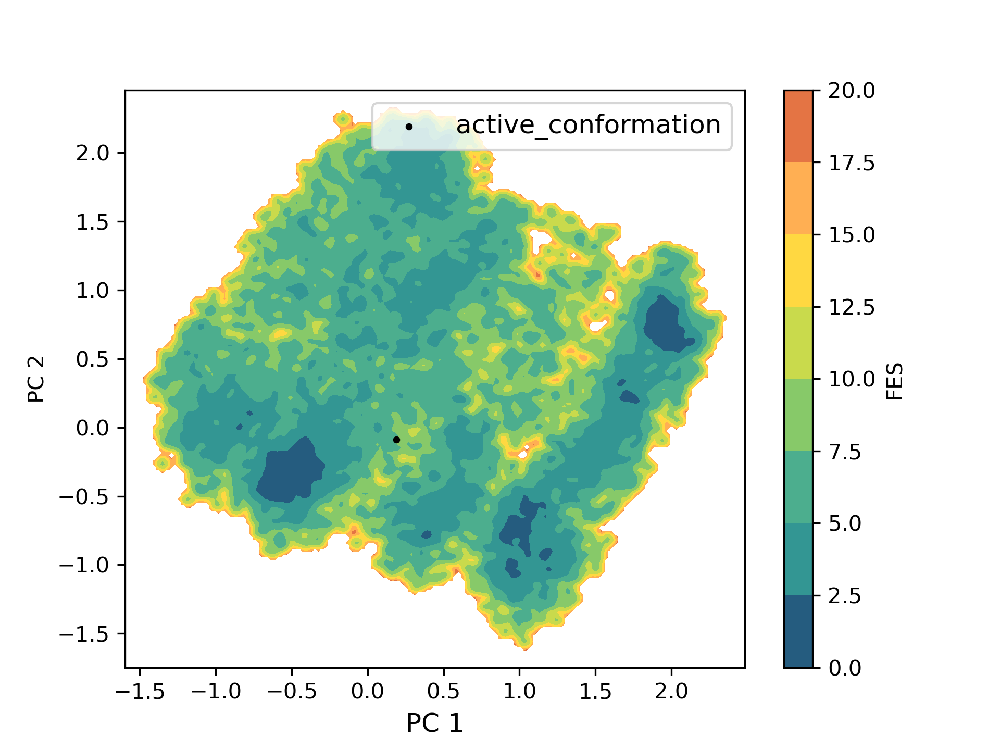

In [14]:
show_results(system_name, 'torsions', 'pca')

### AE

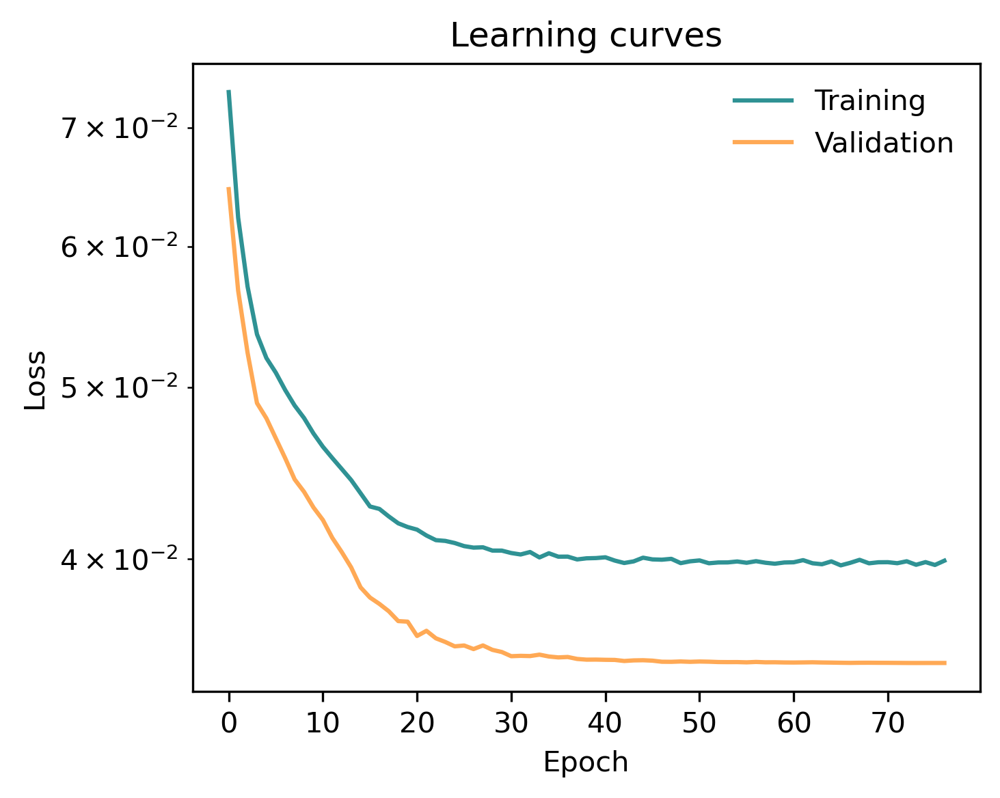

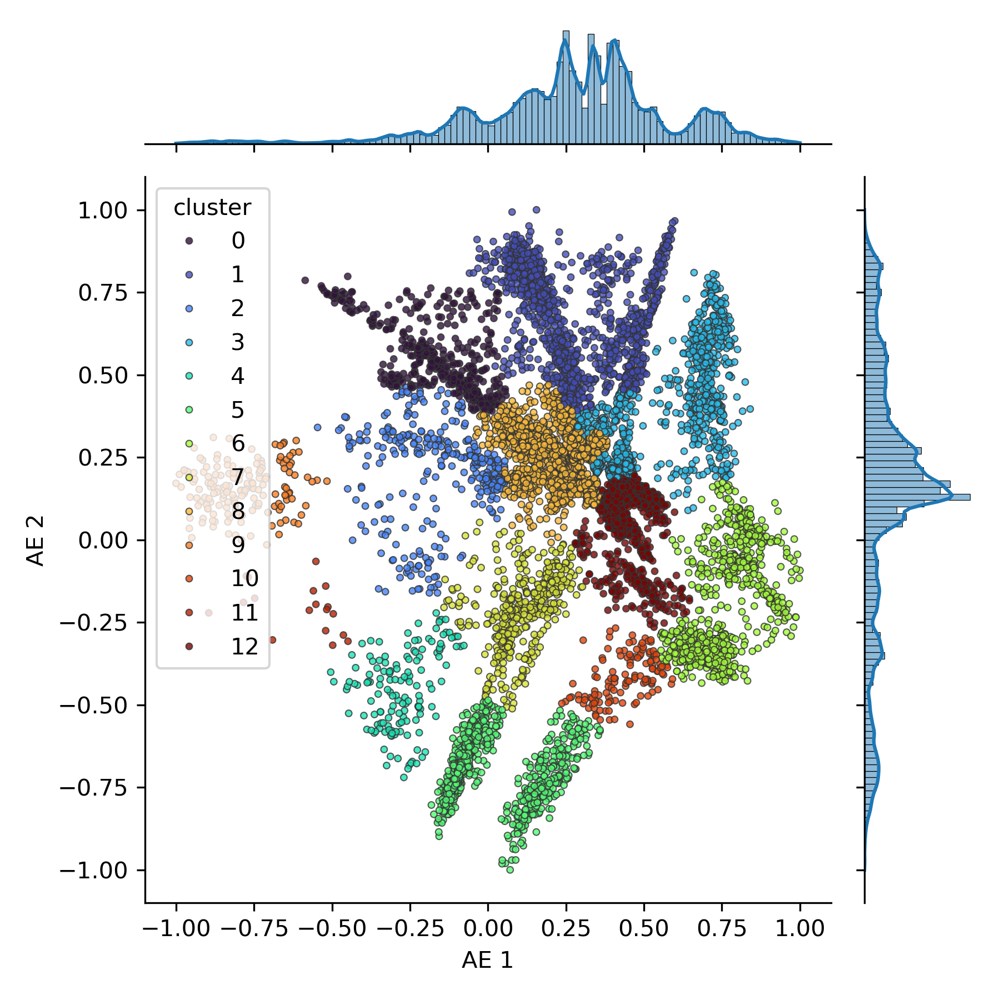

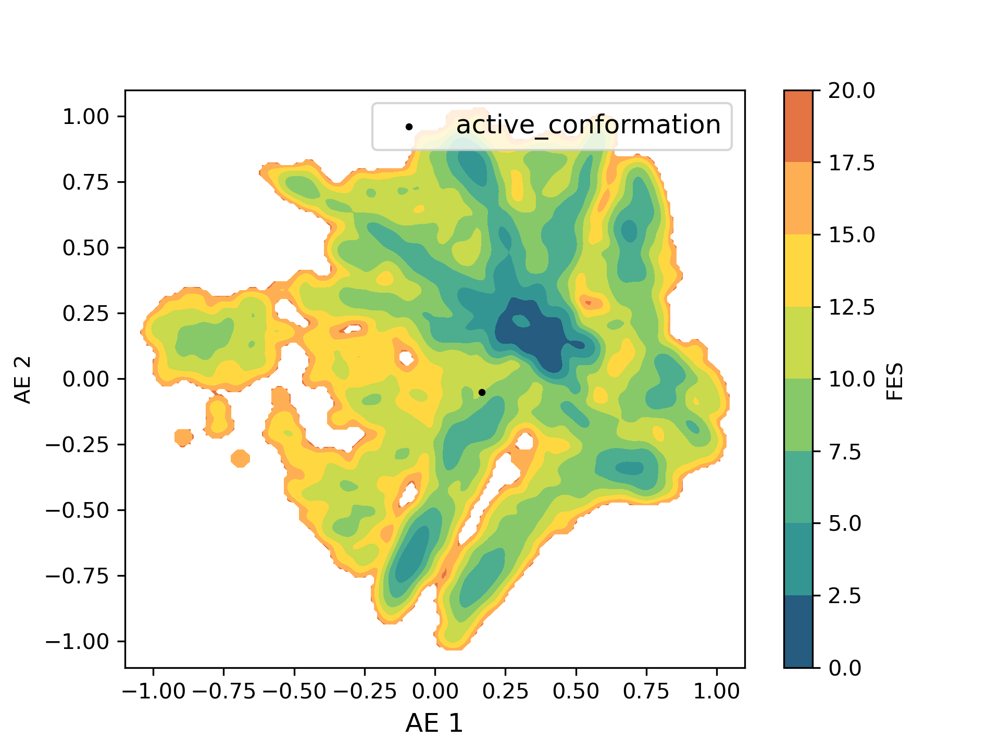

In [15]:
show_results(system_name, 'torsions', 'ae')